In [2]:
#import os
import sqlite3
from datetime import datetime
import warnings
from tqdm import tqdm

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import (InsetPosition)
#from matplotlib.colors import LinearSegmentedColormap
#from matplotlib import colors as mcolors
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster import hierarchy
from statsmodels.nonparametric.kernel_regression import KernelReg


# Suppression warnings KMeans
warnings.filterwarnings(action='ignore', 
                        message='KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.')
warnings.filterwarnings(action='ignore', 
                        message='KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.')
warnings.filterwarnings(action='ignore', 
                        message = 'DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()')


# Liste des fonctions

def f_requete_sql (requete) :
    try:
        connexion = sqlite3.connect('../data/liste_piezos.db')
        curseur = connexion.cursor()
        print("Connexion réussie à SQLite")
        curseur.execute(requete)
        connexion.commit()
        resultat = curseur.fetchall()
        curseur.close()
        connexion.close()
        print("Connexion SQLite est fermée")
        return resultat
    except sqlite3.Error as error:
        print("Erreur lors du mis à jour dans la table", error)

        
def scaleColumns(df):
    for col in df.columns:
        df[col] = pd.DataFrame(scaler.fit_transform(pd.DataFrame(df[col])),columns=[col], index=df.index)
    return df        


def f_clusters_transform (df):
    """
    df : dataframe pandas
    """
    data = df.values.T
    names = df.columns
    return(data, names)



def f_clusters_coude (df, n_init:int=100, plage:tuple = (2,20)) :
    """
    df : dataframe à entrer
    n_init : nombre de configuration de départ pour les centroïdes
    plage : plage de mesure du k optimal
    """   
    
    # Transformation du dataframe d'entrée pour analyse
    data, names = f_clusters_transform(df)

    if plage[1] > data.shape[0]:
        plage[1] = data.shape[0]

    k_mesure = range(plage[0], plage[1])

    results = pd.DataFrame(index=k_mesure, columns=["inertia"], dtype='float')

    for k in tqdm (k_mesure,
                    desc="Calcul de l'inertie",  
                    ascii=False, ncols=100) :
        km = KMeans(n_clusters=k, n_init=n_init) 
        km = km.fit(data)
        inertie = km.inertia_
        results.loc[k,"inertia"] = inertie

        
    # Calcul des dérivées premières et secondes.
    # yb - ya / xb - xa
    # On prend en compte la pente de la droite qui suit le point en quaestion
    results["deriv"] = np.NaN
    for k in results.index.values:
        try : 
            results.loc[k, "deriv"] = results.loc[k+1, "inertia"] - results.loc[k, "inertia"]
        except:
            pass

    results["deriv_2"] = np.NaN
    for k in results.index.values:
        try : 
            results.loc[k, "deriv_2"] = results.loc[k+1, "deriv"] - results.loc[k, "deriv"]
        except:
            pass
    
    # Conservation du premier point avec inertie sur k inférieure à la moyenne - 2sigma calculée pour k > 10
    median = results.loc[10:,"deriv_2"].quantile(0.5)
    Q1 = results.loc[10:,"deriv_2"].quantile(0.25)
    Q3 = results.loc[10:,"deriv_2"].quantile(0.75)
    
    mean = results.loc[10:,"deriv_2"].mean()
    sigma = results.loc[10:,"deriv_2"].std()
      
    best_k = results[results.deriv_2 < (mean + 2*sigma)].first_valid_index()
        
        
    fig, ax1 = plt.subplots(figsize=(12,8))

    fig.suptitle(f"Nombre de cluster optimal estimé : {best_k}")

    ax1.plot(results.inertia)
    ax1.set_xlabel('nombre de clusters')
    ax1.set_ylabel('inertie')
    ax1.legend(["inertie"], bbox_to_anchor=(1.05, 1.0), loc='upper left')
    ax1.scatter(best_k, results.loc[best_k,"inertia"],s=100, c='red', marker='X')
    ax1.axvline(x=best_k, color='gray',linestyle='--')

    ax2 = plt.axes([0,0,1,1])
    # Manually set the position and relative size of the inset axes within ax1
    ip = InsetPosition(ax1, [0.45,0.45,0.5,0.5])
    ax2.set_axes_locator(ip)
    # Mark the region corresponding to the inset axes on ax1 and draw lines
    # in grey linking the two axes.
    ax2.plot(results.deriv_2)
    ax2.set_xlabel('nombre de clusters')
    ax2.set_ylabel('dérivée 2nde')
    ax2.axvline(x=best_k, color='gray',linestyle='--')
    ax2.fill_between(np.arange(1,plage[1]), 
                     mean + 2*sigma, 
                     mean - 2*sigma, 
                     color='lightcoral')

    return best_k, results
    
    
    
def f_clusters_fit (df, k:int = 4, n_init:int = 100, max_iter:int = 2000):
    
    """
    Entrainement et affichage de la distribution dans les clusters
    return :
    - cluster_table : df bss - cluster - MSE
    - df_clusters_centers : df série temporelle des clusters
    - metric : "euclidean" / "dtw" / "softdtw"
    """
    
    data, names = f_clusters_transform(df)
    # Initilialisation du modèle
    km = KMeans(n_clusters=k, n_init=n_init, max_iter=max_iter, random_state=2022)
    # Entraînement du modèle
    km.fit(data)
    # Définition des numéros de cluster
    labels = km.labels_+1 
    # Profils des clusters
    cluster_centers = np.array(km.cluster_centers_)
    df_cluster_centers = pd.DataFrame(cluster_centers.T, index=df.index)
    for cluster in range(df_cluster_centers.shape[1]):
        df_cluster_centers.rename(columns = {cluster:f"cluster_{cluster+1}"}, inplace=True)
    
    # Création du dataframe de résultats
    cluster_table = pd.DataFrame()
    cluster_table["code_bss"] = names
    cluster_table.set_index("code_bss", inplace=True)
    cluster_table["cluster"] = labels
    for piezo in cluster_table.index :
        cluster_table.loc[piezo, "MSE"] = mean_squared_error(df.loc[:,piezo], cluster_centers[cluster_table.loc[piezo, "cluster"]-1])
    
    return cluster_table, df_cluster_centers

def f_plot_clusters (df, cluster_table, cluster_centers, plot_mean:bool = True):
    
    data, names = f_clusters_transform (df)
    
    labels = cluster_table["cluster"]
    
    fig, axs = plt.subplots(len(set(labels)),1,figsize=(20,4*cluster_centers.shape[1]))
    row_i=0

    for label in set(labels):
        for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i].plot(df.iloc[:,i],alpha=0.4)
        if plot_mean:
            axs[row_i].plot(cluster_centers.iloc[:,label-1],c="red")
        axs[row_i].set_title("Cluster "+str(row_i+1))
        row_i+=1
    plt.show()
    
def f_plot_all (df, cluster_table, df_cluster_centers) :

    if df.shape[1]%4 == 0:
        nbre_lignes = df.shape[1]//4
    else : 
        nbre_lignes = df.shape[1]//4 + 1

    fig, axs = plt.subplots(nbre_lignes,4,figsize=(25,200))
    #fig.suptitle('Series')
    for i in range(nbre_lignes):
        for j in range(4):
            if i*4+j+1>df.shape[1]: # pass the others that we can't fill
                continue
            axs[i, j].plot(df.iloc[:,i*4+j])
            axs[i, j].plot(df_cluster_centers.iloc[:,cluster_table.iloc[i*4+j,0]-1])
            
            axs[i, j].set_title(df.columns[i*4+j] + f" - MSE = {round(cluster_table.loc[df.columns[i*4+j],'MSE'],2)}")
            
    plt.show()
    

def f_MSEmax (cluster_table):
    # Calcul de MSEmin

    Q1 = cluster_table["MSE"].quantile(0.25, "higher")
    Q3 = cluster_table["MSE"].quantile(0.75, "lower")

    # Ecart inter-quartile
    IQM = abs(Q3-Q1)

    # Seuil minimal de conservation des chroniques (Q3+1.5*IQM)

    MSEmin = Q3+1.5*IQM
    return MSEmin



def f_cluster_cleaning(data, cluster_table, cluster_centers) :
    """
    Elimination des chroniques avec MSE sous le seuil
    """
    
    MSEmax = f_MSEmax(cluster_table)
    cluster_table.loc[cluster_table.MSE > MSEmax, "cluster"] = 0

    nbre_elim_total = 0
    nbre_elim = cluster_table.loc[cluster_table.MSE > MSEmax, 'MSE'].count()
    nbre_elim_total += nbre_elim

    iteration = 1
    print(f"Itération {iteration} : {nbre_elim} chronique(s) éliminée(s).")

    while nbre_elim != 0 :

        # Selection des clusters non zéro
        data_opt = data.loc[:,cluster_table.loc[cluster_table.cluster != 0].index]

        # Nouveau clustering
        cluster_table, cluster_centers = f_clusters_fit(data_opt, nbre_clusters, n_init = 2000, max_iter = 500)

        # chroniques sous le seuil passées à cluster 0
        MSEmax = f_MSEmax(cluster_table)
        nbre_elim = cluster_table.loc[cluster_table.MSE > MSEmax, 'MSE'].count()   
        nbre_elim_total += nbre_elim


        cluster_table.loc[cluster_table.MSE > MSEmax, "cluster"] = 0
        iteration += 1
        print(f"Itération {iteration} : {nbre_elim} chronique(s) éliminée(s).")


    for index, column in enumerate (cluster_centers.columns):
        cluster_centers.rename(columns={column : f"{index+1}"}, inplace=True)    

    print(f"Nombre total de chroniques éliminées : {nbre_elim_total}")

    plt.figure(figsize=(6, 5))
    ax = cluster_table["MSE"].sort_values().plot(title = "MSE chronique / centroïde")
    ax.set_xlabel("")
    ax.set_ylabel("MSE")
    ax.tick_params(left = True, right = False , labelleft = True ,
                    labelbottom = False, bottom = False)
    plt.show()

    return (data_opt, cluster_table, cluster_centers)

# Détermination du nombre optimal de clusters par région

Il y a 89 piezos pour le clustering dans le dataframe.


Calcul de l'inertie: 100%|██████████████████████████████████████████| 14/14 [00:27<00:00,  1.97s/it]


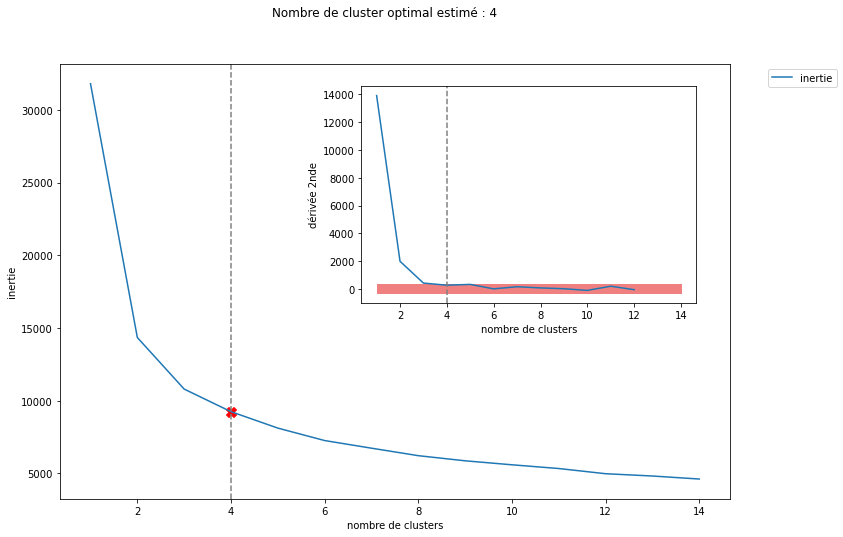

In [5]:
region = "PDL"

# Import du csv et conversion en dataframe
custom_date_parser = lambda x: datetime.strptime(x, "%Y-%m-%d")
data = pd.read_csv(f"../data/clusters/{region}.csv", sep = ";", parse_dates=True, index_col="date_mesure", date_parser=custom_date_parser)

print(f"Il y a {data.shape[1]} piezos pour le clustering dans le dataframe.")

# Normalisation
scaler = StandardScaler()
data = scaleColumns(data)

best_k, results = f_clusters_coude(data, n_init=500, plage=(1,15))

# Création des clusters

In [4]:
dict_region = {"ARA" : 4, 
               "BFC" : 5, 
               "BRE" : 3, 
               "CVL" : 4, 
               "GES" : 6, 
               "HDF" : 4, 
               "IDF" : 5, 
               "NAQ" : 6, 
               "NOR" : 3, 
               "OCC" : 4, 
               "PAC" : 2, 
               "PDL" : 3
              }

================== Analyse de la région ARA ==================
Il y a 111 piezos pour le clustering dans le dataframe.
Itération 1 : 3 chronique(s) éliminée(s).
Itération 2 : 1 chronique(s) éliminée(s).
Itération 3 : 2 chronique(s) éliminée(s).
Itération 4 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 6


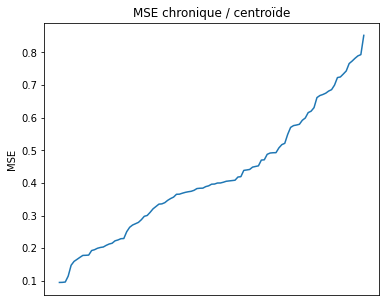

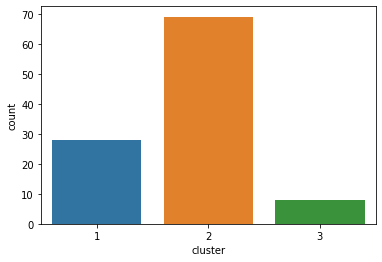

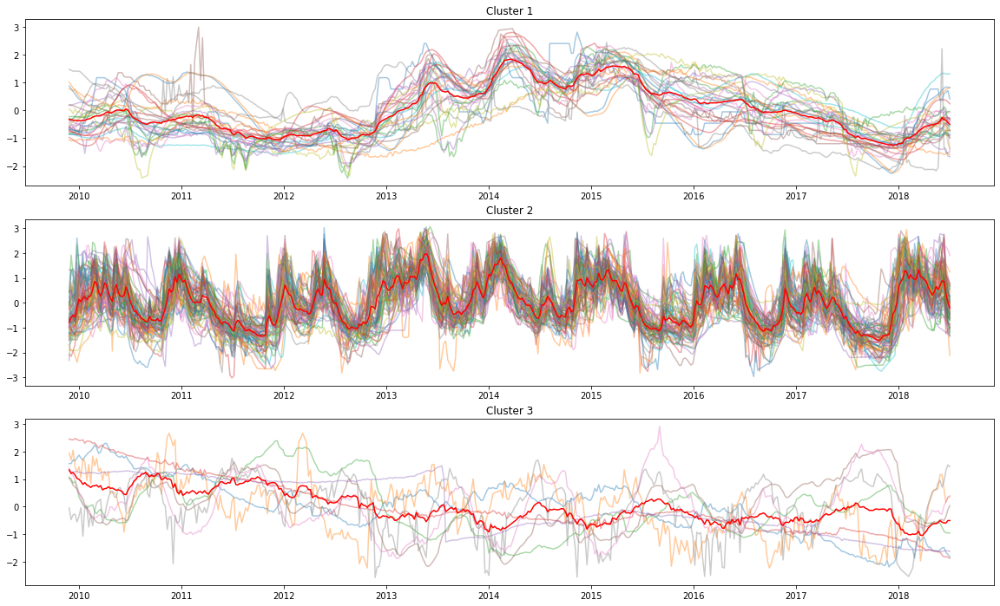

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région BFC ==================
Il y a 76 piezos pour le clustering dans le dataframe.
Itération 1 : 3 chronique(s) éliminée(s).
Itération 2 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 3


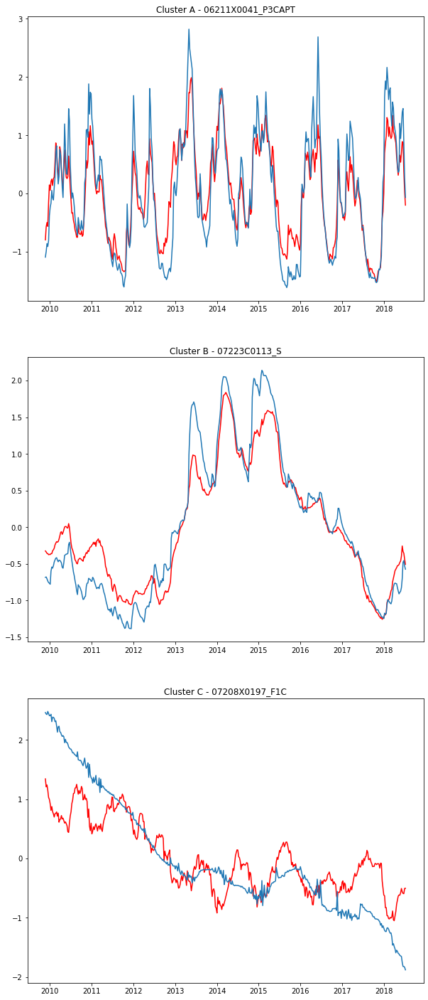

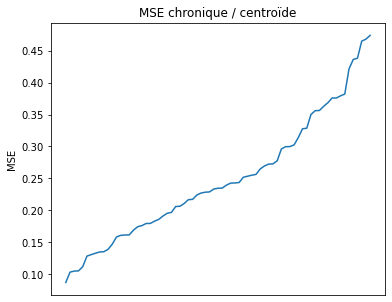

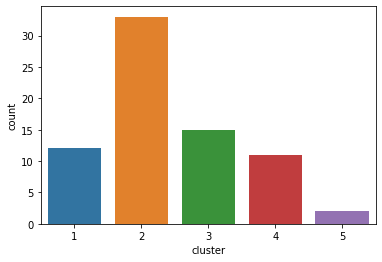

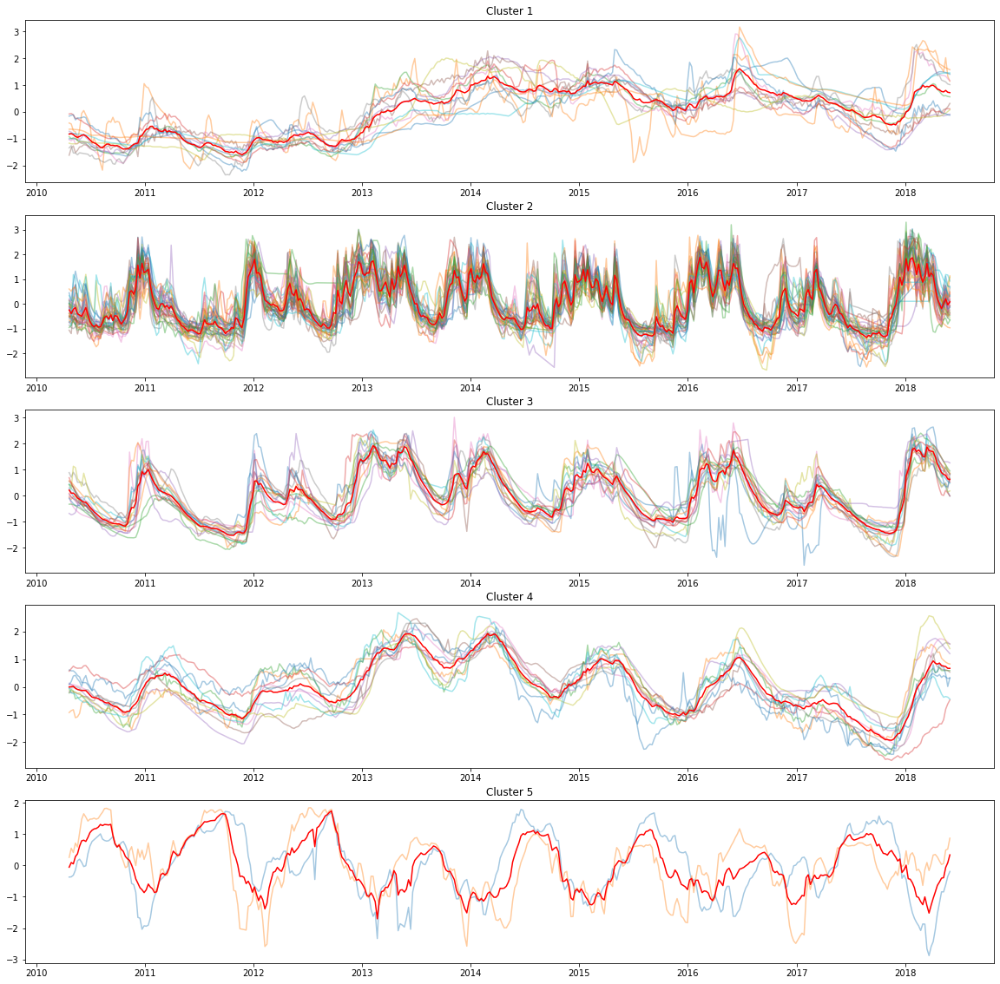

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région BRE ==================
Il y a 40 piezos pour le clustering dans le dataframe.
Itération 1 : 4 chronique(s) éliminée(s).
Itération 2 : 1 chronique(s) éliminée(s).
Itération 3 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 5


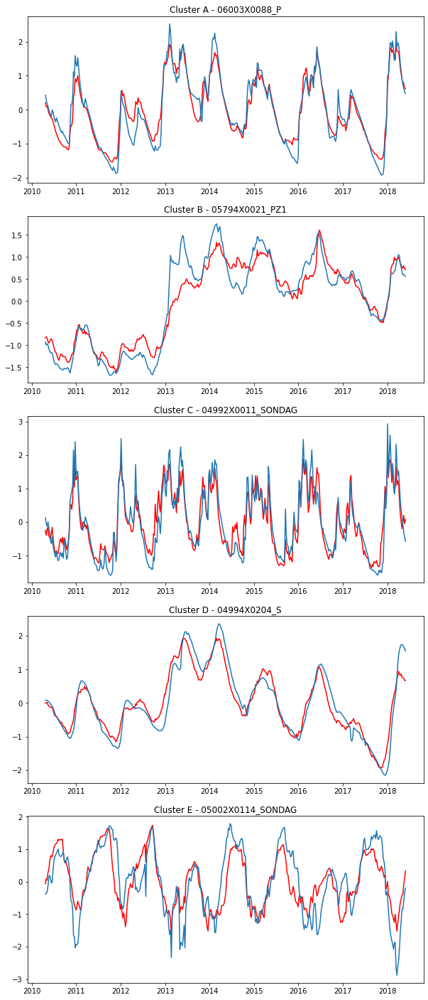

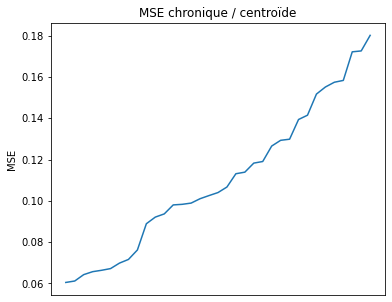

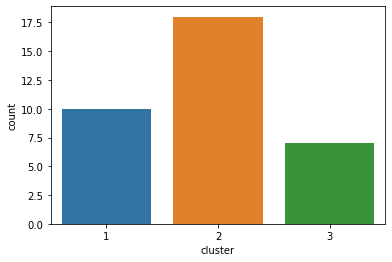

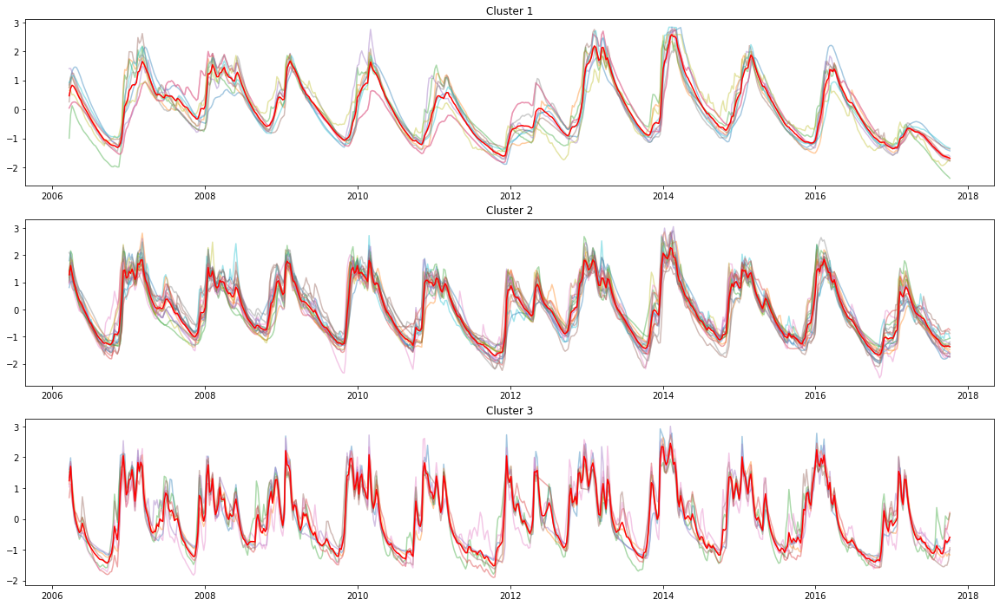

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région CVL ==================
Il y a 121 piezos pour le clustering dans le dataframe.
Itération 1 : 5 chronique(s) éliminée(s).
Itération 2 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 5


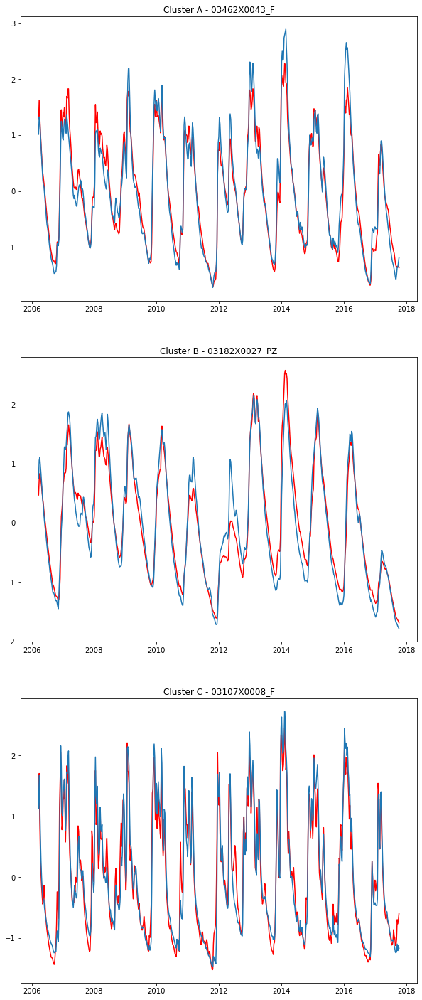

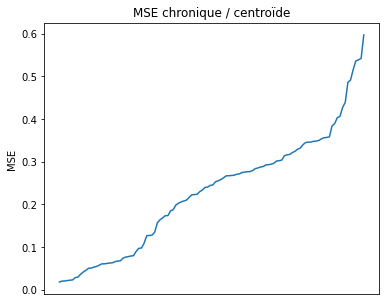

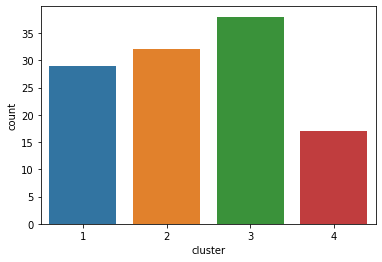

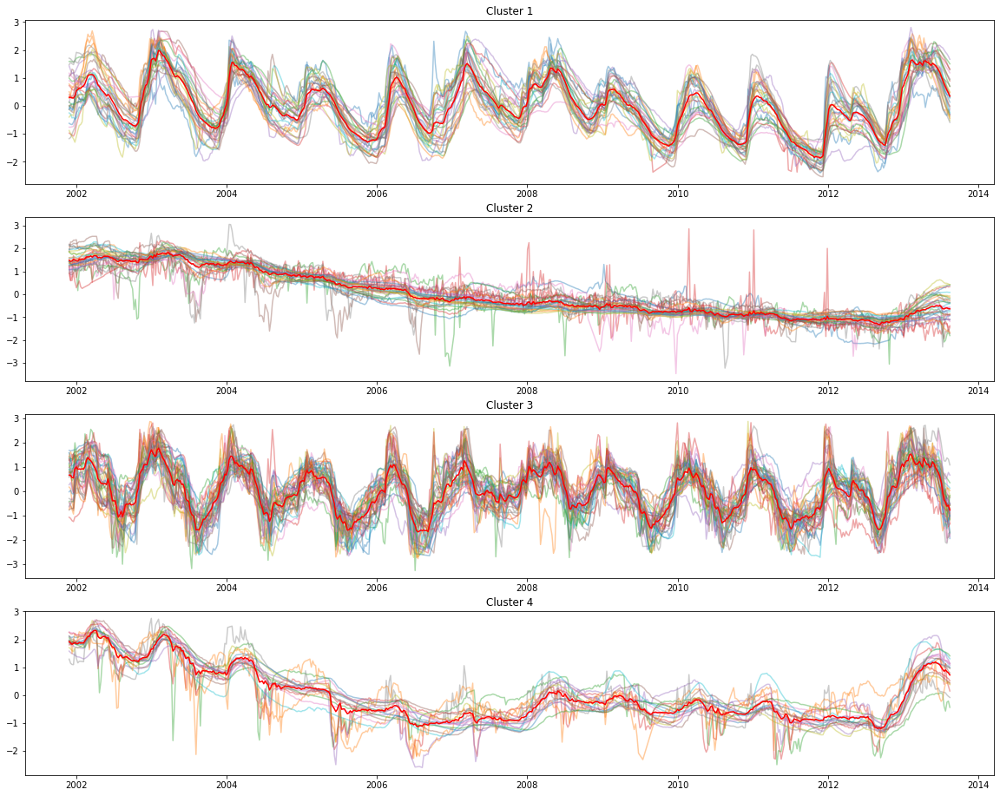

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région GES ==================
Il y a 186 piezos pour le clustering dans le dataframe.
Itération 1 : 11 chronique(s) éliminée(s).
Itération 2 : 4 chronique(s) éliminée(s).
Itération 3 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 15


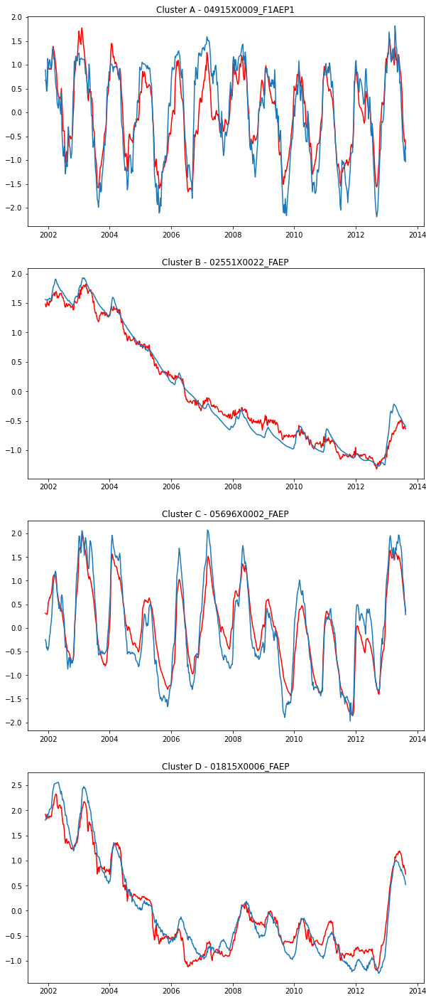

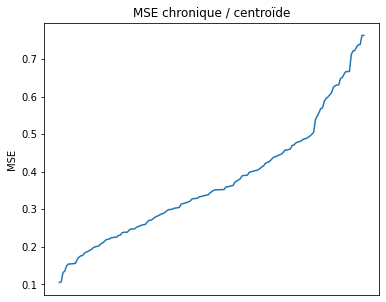

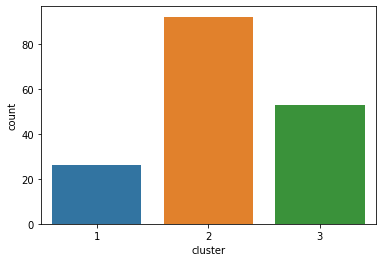

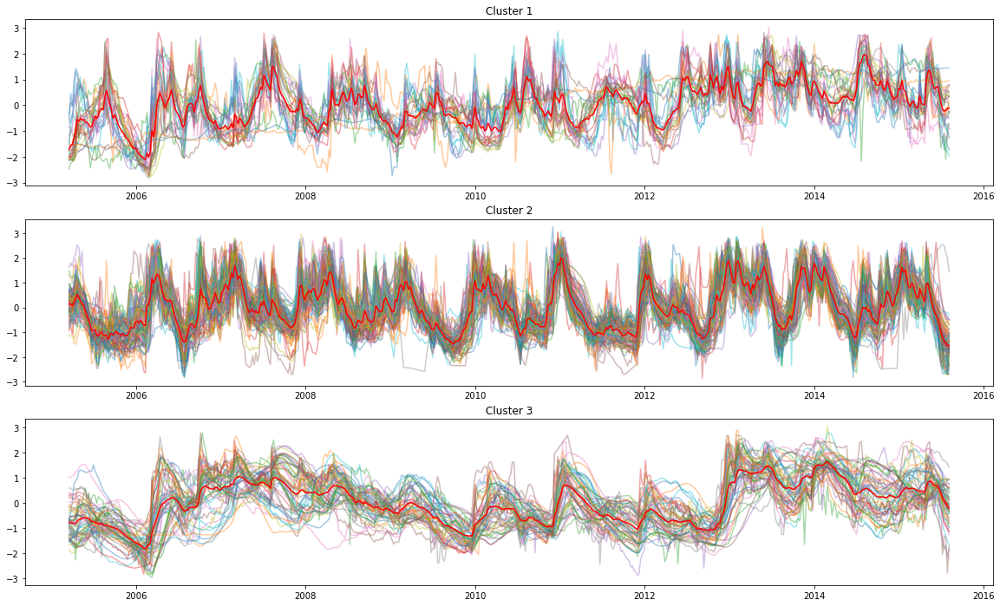

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région HDF ==================
Il y a 120 piezos pour le clustering dans le dataframe.
Itération 1 : 10 chronique(s) éliminée(s).
Itération 2 : 3 chronique(s) éliminée(s).
Itération 3 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 13


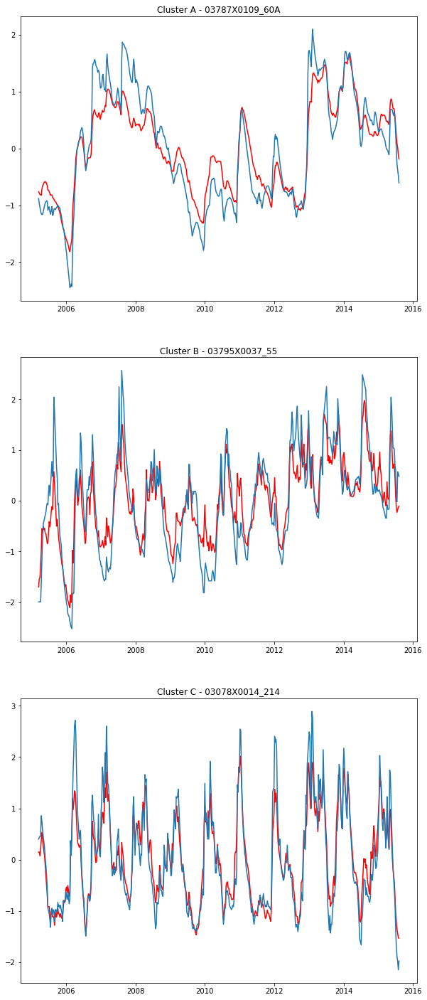

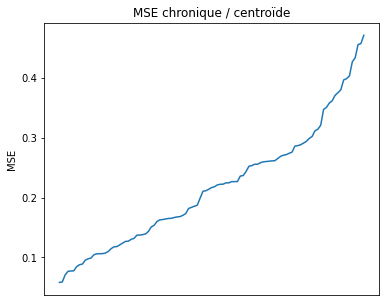

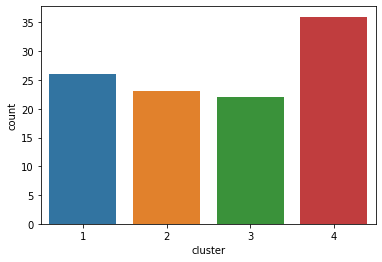

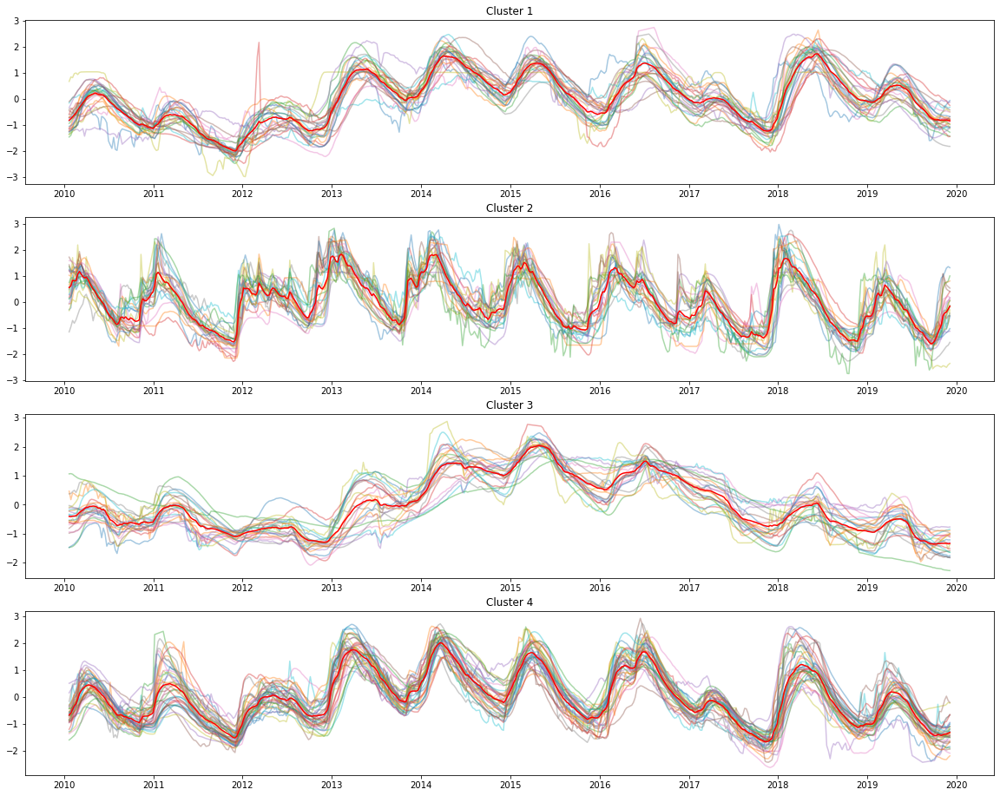

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région IDF ==================
Il y a 37 piezos pour le clustering dans le dataframe.
Itération 1 : 2 chronique(s) éliminée(s).
Itération 2 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 2


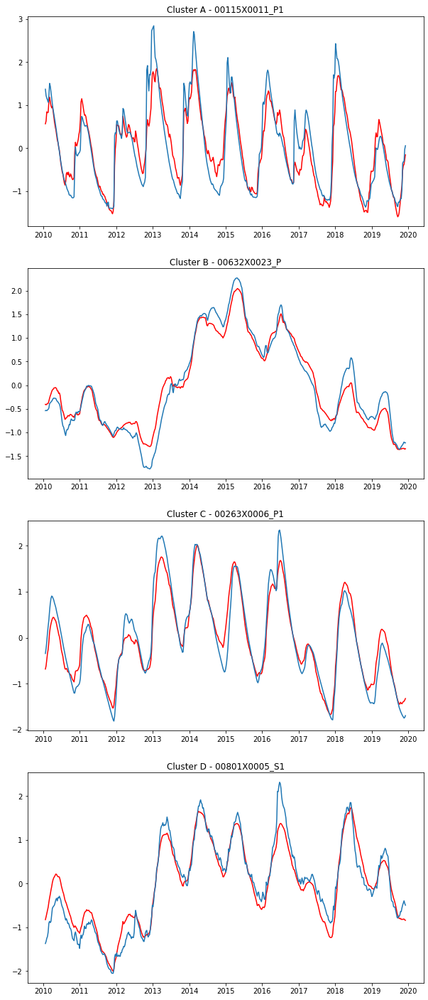

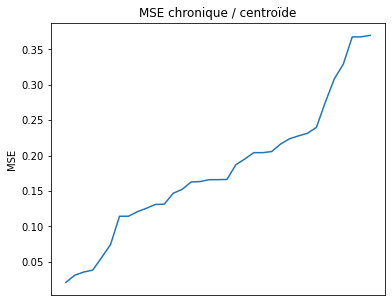

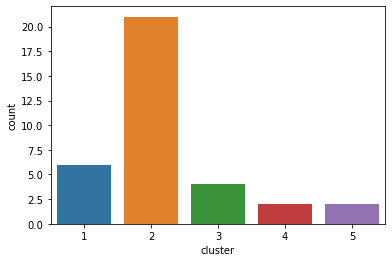

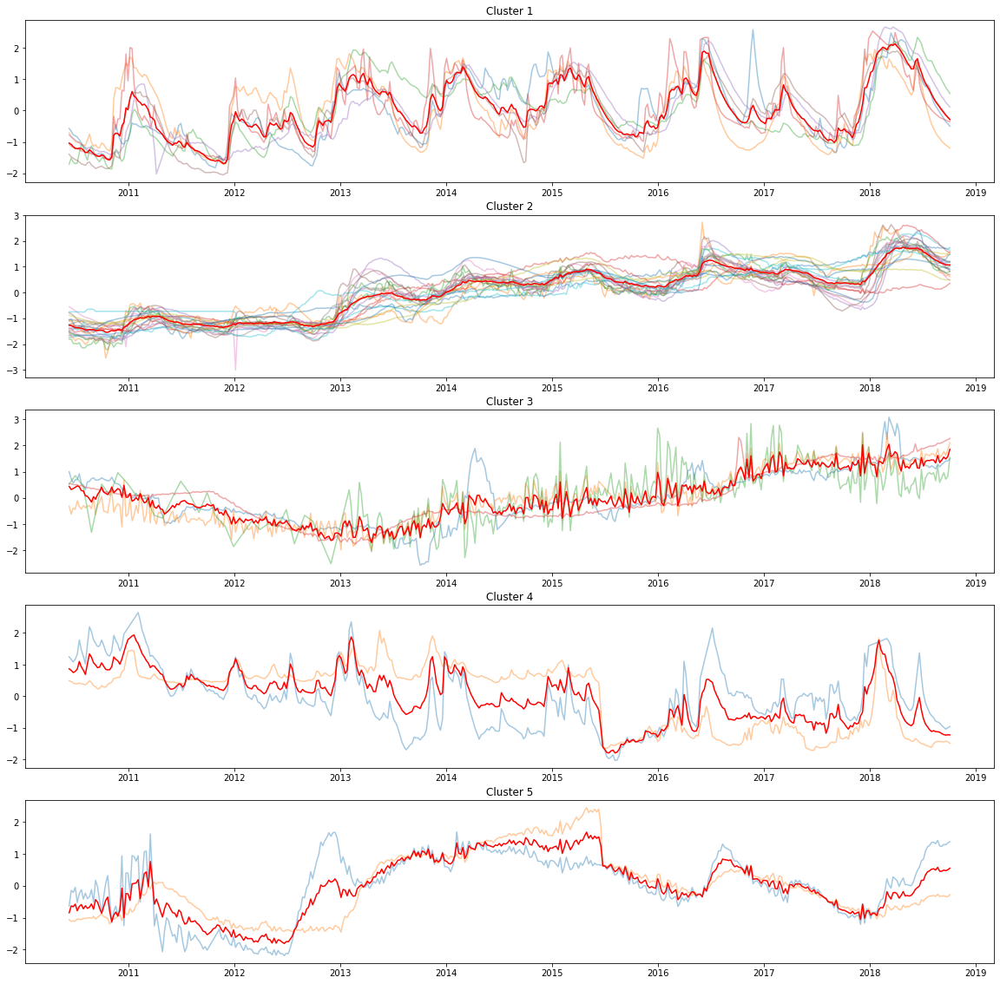

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région NAQ ==================
Il y a 424 piezos pour le clustering dans le dataframe.
Itération 1 : 27 chronique(s) éliminée(s).
Itération 2 : 20 chronique(s) éliminée(s).
Itération 3 : 13 chronique(s) éliminée(s).
Itération 4 : 3 chronique(s) éliminée(s).
Itération 5 : 1 chronique(s) éliminée(s).
Itération 6 : 2 chronique(s) éliminée(s).
Itération 7 : 0 chronique(

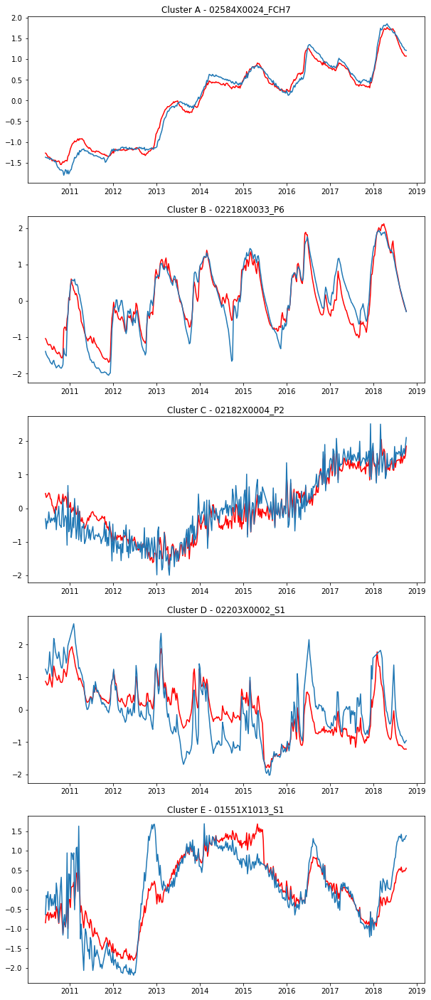

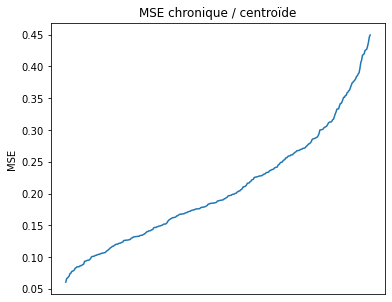

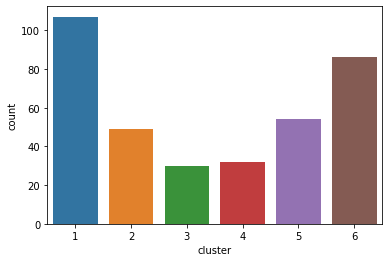

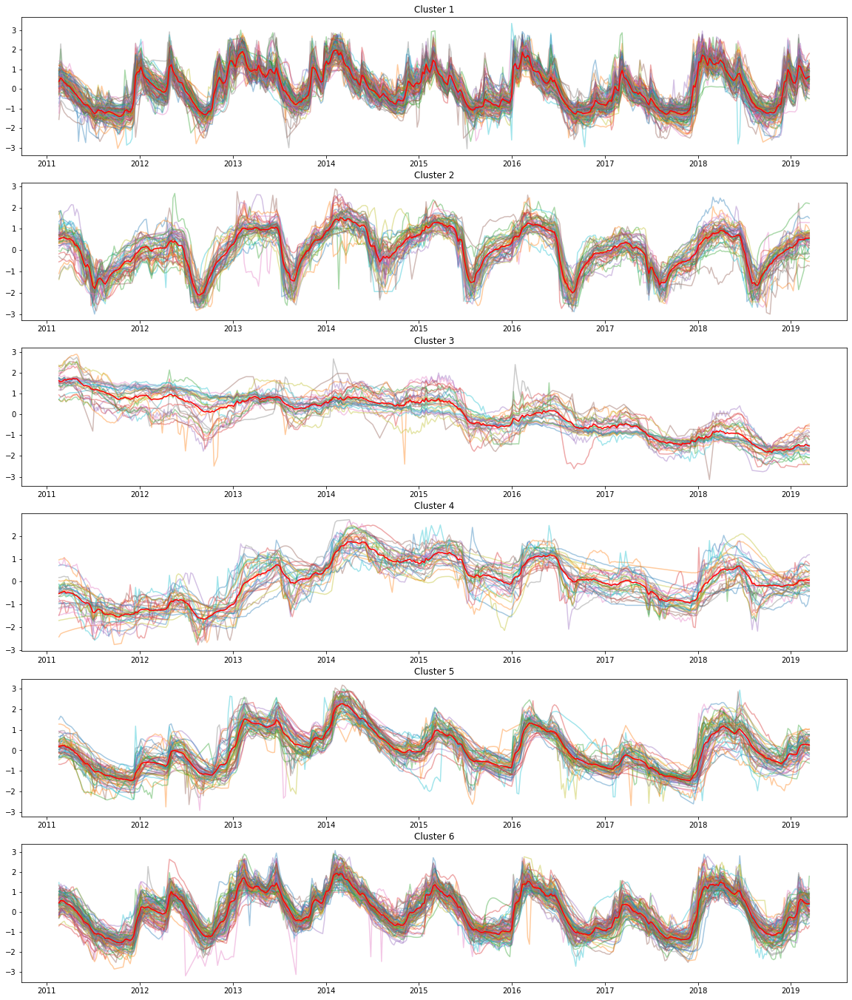

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région NOR ==================
Il y a 102 piezos pour le clustering dans le dataframe.
Itération 1 : 8 chronique(s) éliminée(s).
Itération 2 : 3 chronique(s) éliminée(s).
Itération 3 : 1 chronique(s) éliminée(s).
Itération 4 : 3 chronique(s) éliminée(s).
Itération 5 : 0 chronique(s) éliminée(s).
Nombre total de 

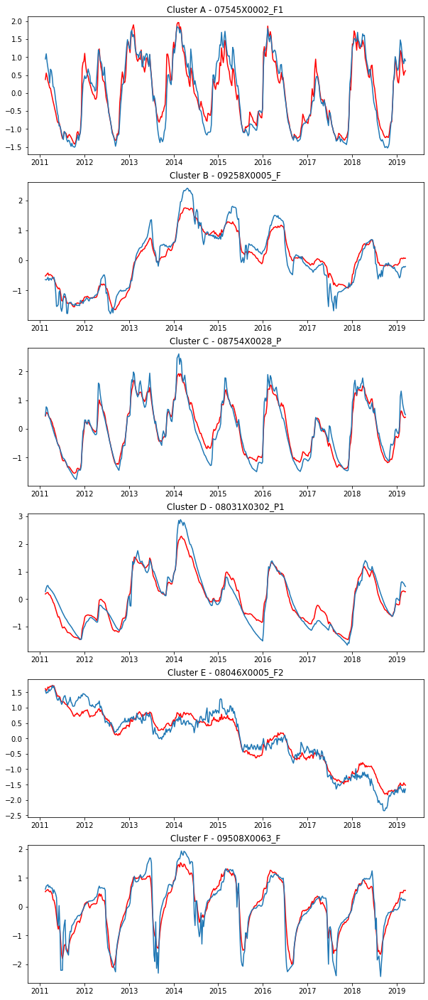

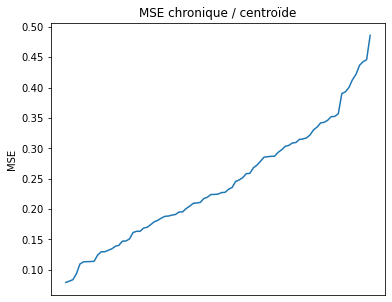

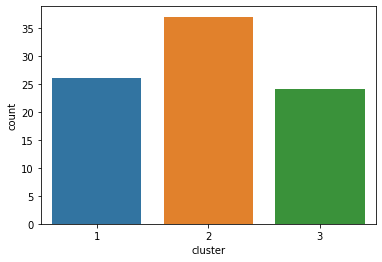

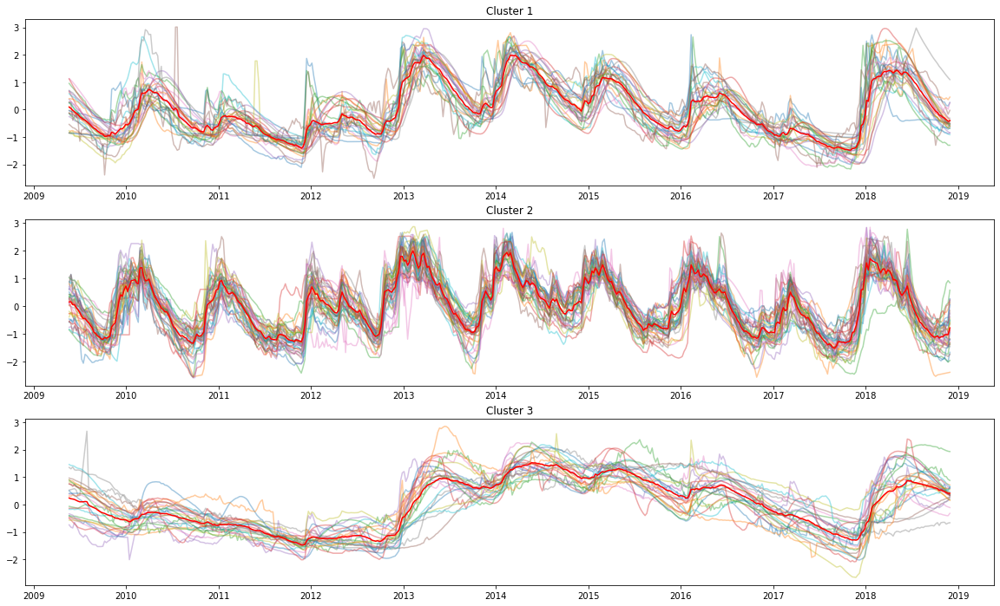

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région OCC ==================
Il y a 127 piezos pour le clustering dans le dataframe.
Itération 1 : 1 chronique(s) éliminée(s).
Itération 2 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 1


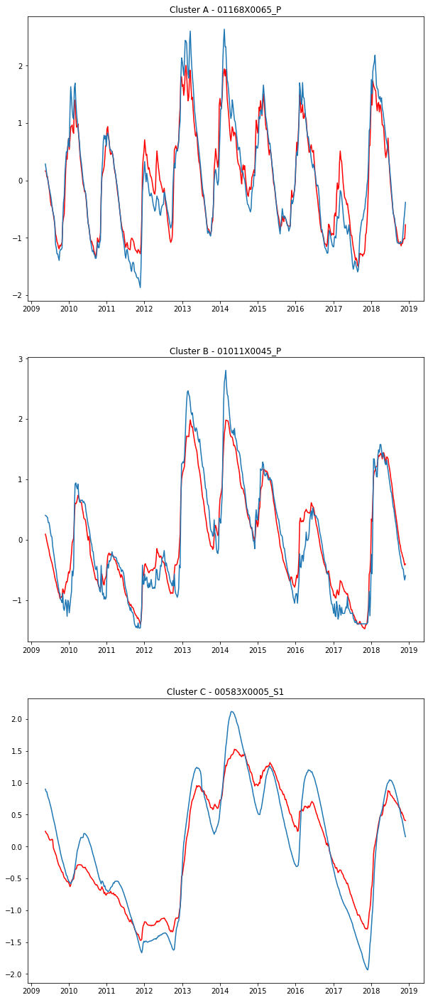

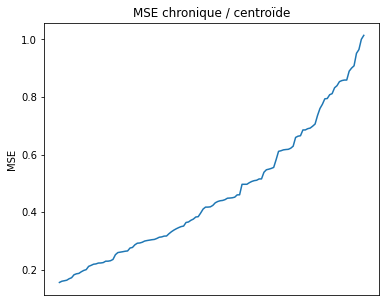

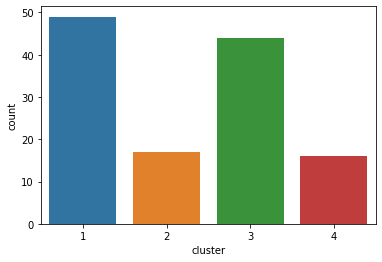

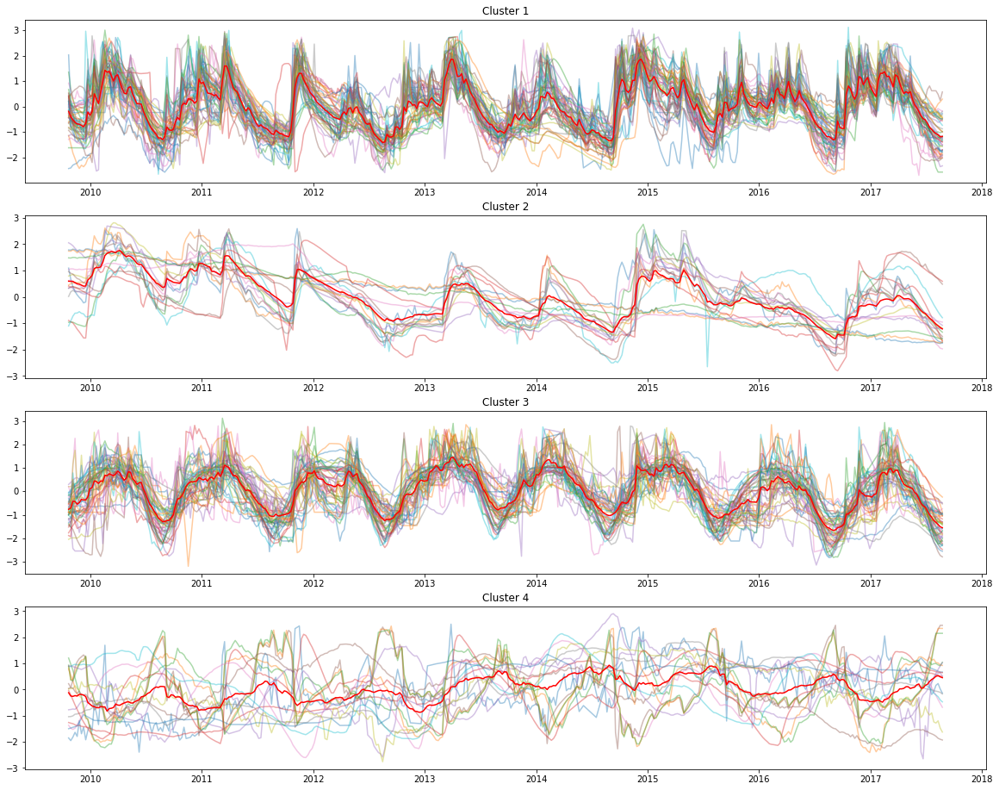

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région PAC ==================
Il y a 37 piezos pour le clustering dans le dataframe.
Itération 1 : 3 chronique(s) éliminée(s).
Itération 2 : 4 chronique(s) éliminée(s).
Itération 3 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 7


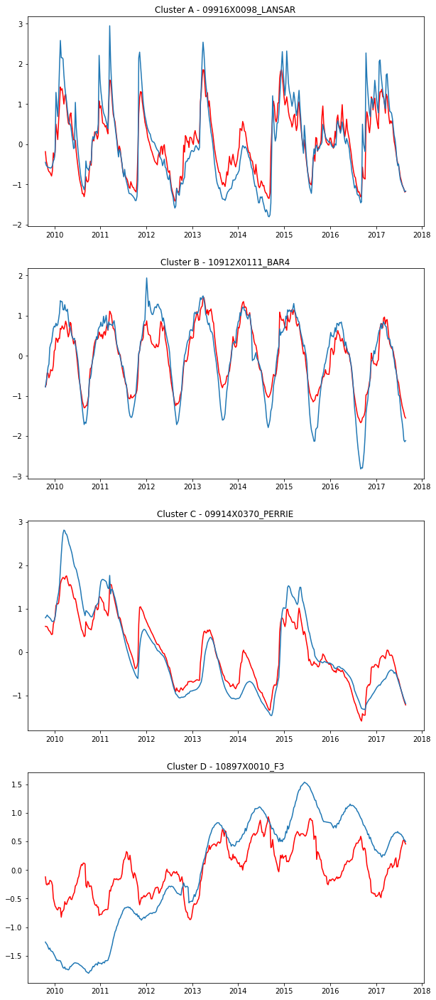

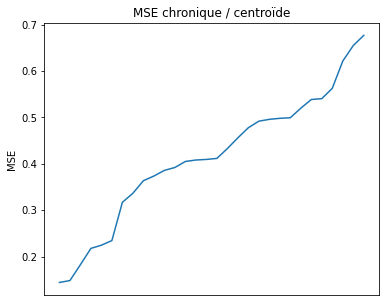

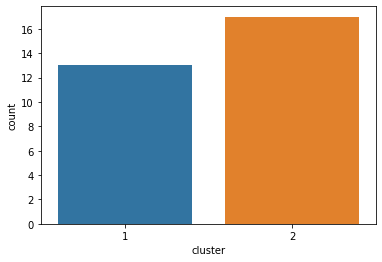

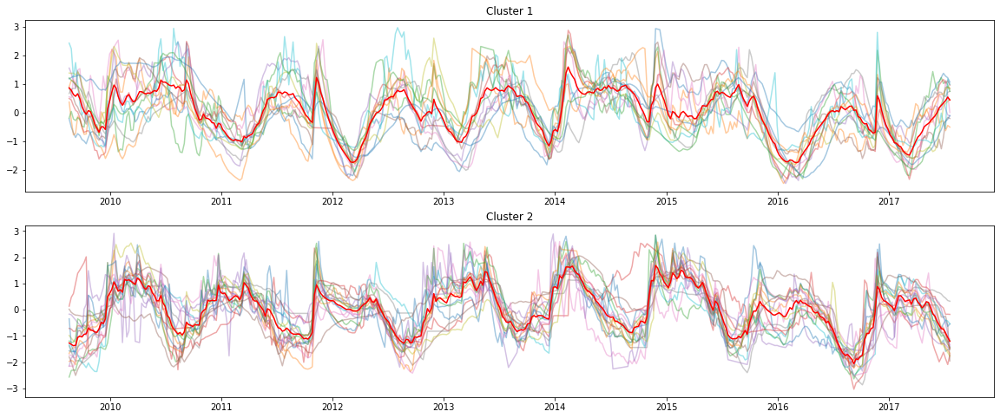

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
================== Analyse de la région PDL ==================
Il y a 93 piezos pour le clustering dans le dataframe.
Itération 1 : 7 chronique(s) éliminée(s).
Itération 2 : 7 chronique(s) éliminée(s).
Itération 3 : 4 chronique(s) éliminée(s).
Itération 4 : 4 chronique(s) éliminée(s).
Itération 5 : 0 chronique(s) éliminée(s).
Nombre total de chroniques éliminées : 22


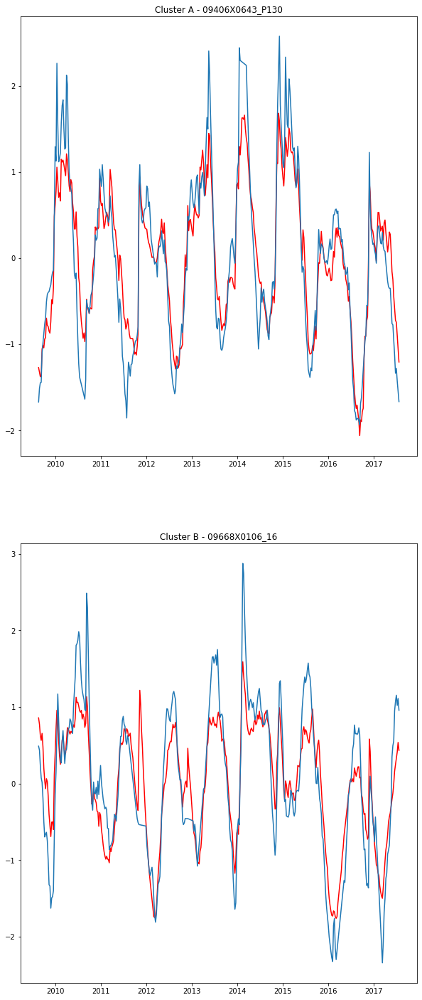

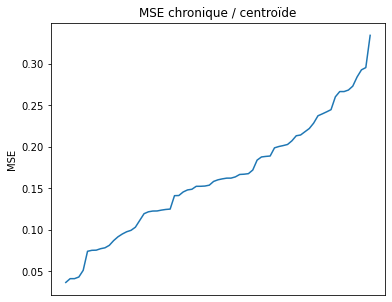

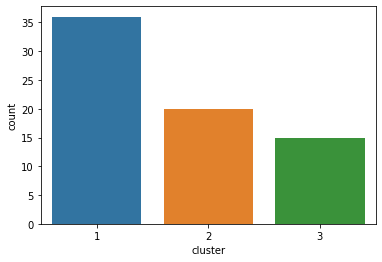

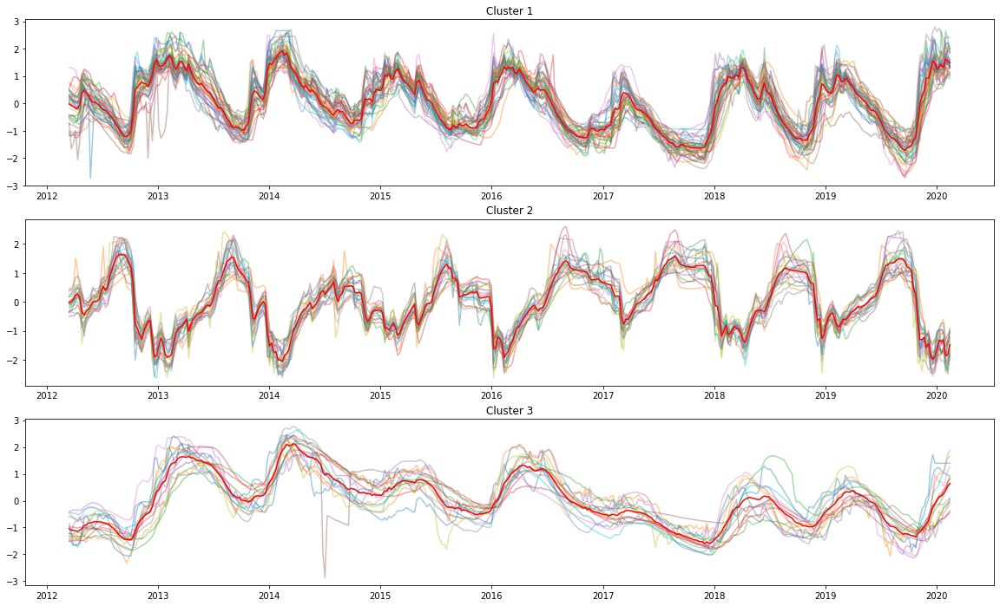

Connexion réussie à SQLite
Erreur lors du mis à jour dans la table duplicate column name: cluster_kmeans
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée
Connexion réussie à SQLite
Connexion SQLite est fermée


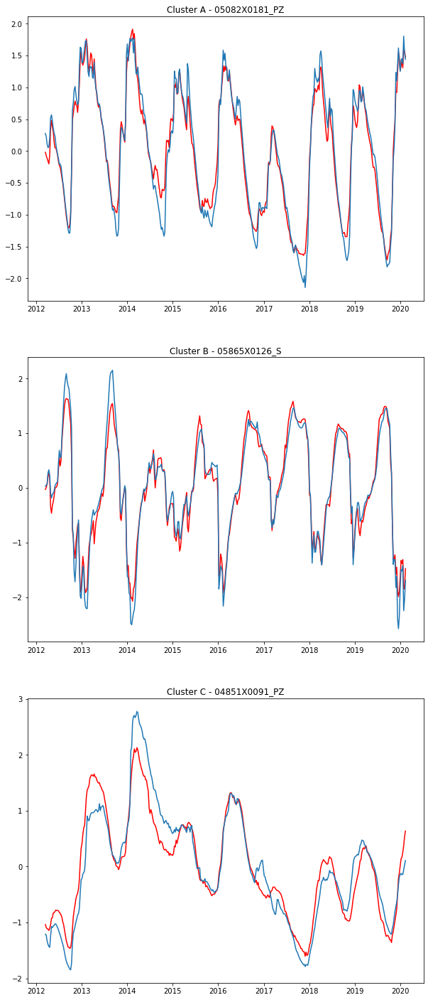

In [10]:
for region in dict_region.keys () :
    
    print(f"================== Analyse de la région {region} ==================")
    
    # Import du csv et conversion en dataframe
    custom_date_parser = lambda x: datetime.strptime(x, "%Y-%m-%d")
    data = pd.read_csv(f"./data/{region}.csv", sep = ";", parse_dates=True, index_col="date_mesure", date_parser=custom_date_parser)

    print(f"Il y a {data.shape[1]} piezos pour le clustering dans le dataframe.")
    
    # Normalisation
    scaler = StandardScaler()
    data = scaleColumns(data)
    
    # Choix du nombre de clusters à créer
    # Récupération du nombre de clusters en fonction de la région
    nbre_clusters = dict_region[region]
    
    # Entrainement
    cluster_table, cluster_centers = f_clusters_fit(data, nbre_clusters, n_init = 2000, max_iter = 500)

    # répartition des piezos dans les clusters
    #sns.countplot(data = cluster_table, x = "cluster")
    
    # Affichage des chroniques par cluster
    #f_plot_clusters(data, cluster_table, cluster_centers)
    
    # Elimination des chroniques avec MSE sous le seuil
    data_opt, cluster_table, cluster_centers = f_cluster_cleaning(data, cluster_table, cluster_centers)
 
    # répartition des piezos dans les clusters
    sns.countplot(data = cluster_table, x = "cluster")

    # Affichage des chroniques par cluster
    f_plot_clusters(data_opt, cluster_table, cluster_centers)
    

    # Renommage des clusters
    clusters =  list(range(1, nbre_clusters +1))
    clusters_by_count = cluster_table.cluster.value_counts().index.to_list()
    new_clusters = []
    ch = "A"
    for number in clusters_by_count :
        new_clusters.append(chr(ord(ch)+number-1))

    # Renommage des clusters avec des lettres et par fréquence

    # - Cluster table
    cluster_table.replace(list(map(int, clusters)), new_clusters, inplace=True)

    # - Cluster centers
    dict_rename = dict(zip(map(str, clusters), new_clusters))
    cluster_centers.rename(columns=dict_rename, inplace=True)
    
    # Enregistrement des profils des clusters
    cluster_centers.to_csv(f"./data/{region}_clusters.csv")
    
    # Enregistrement dans la bdd
    # Nom de la table
    champ = "cluster_kmeans"

    # Création de la table
    requete = f"""
                        ALTER TABLE data_piezo
                        ADD {champ} VARCHAR(6) DEFAULT NULL
                        """
    f_requete_sql(requete)

    # Suppression des clusters existants pour la région
    requete = f"""
        UPDATE data_piezo
        SET {champ} = NULL
        WHERE {champ} LIKE '{region}%'
        """
    f_requete_sql(requete)

    # Création de listes de nuéro de cluster avec le nom des piezos
    # Ajout dans la bdd
    for label in set(cluster_table.cluster):
        cluster = tuple(cluster_table.loc[cluster_table.cluster == label, 'cluster'].index.to_list())
        requete = f"""
            UPDATE data_piezo
            SET {champ} = '{region}_{label}'
            WHERE code_bss IN {cluster}
            """
        f_requete_sql(requete)
        
    
    # Recherche du code_bss avec la valeur MSE la plus faible
    liste_top_bss = []
    for cluster in cluster_table.cluster.unique() :
        liste_top_bss.append(cluster_table.loc[cluster_table.cluster == cluster].sort_values("MSE").index[0])
    df_top = pd.DataFrame(liste_top_bss, cluster_table.cluster.unique(), columns=["code_bss"])
    df_top = df_top.sort_index()

    fig, axs = plt.subplots(len(df_top),1,figsize=(10,25))
    for i in range (len(df_top)):
        cluster = df_top.index[i]
        bss = df_top.code_bss[cluster]
        axs[i].plot(cluster_centers.loc[:,cluster], 'red')
        axs[i].plot(data_opt.loc[:,bss])
        axs[i].set_title("Cluster "+ cluster + " - " + bss)    
        
    # Enregisttrement des chroniques type en bdd
    code_cluster = tuple(region + "_" +  df_top.index)
    code_bss = tuple(df_top.code_bss.values)
    tableau = list(np.stack((code_cluster,code_bss), axis=1))
    for index, line in enumerate(tableau):
        tableau[index] = tuple(line)
        
    # Création de la table
    requete = f"""
                CREATE TABLE IF NOT EXISTS flagship_piezo (
                code_cluster VARCHAR(8) PRIMARY KEY ON CONFLICT IGNORE,
                code_bss VARCHAR(8)
                )
                """
    f_requete_sql(requete)
    
    # Suppression des lignes où la région est déjà présente
    requete = f"""
        DELETE FROM flagship_piezo
        WHERE code_cluster LIKE '{region}%'
        """
    f_requete_sql(requete)
    
    
    requete = f"INSERT INTO flagship_piezo (code_cluster, code_bss) VALUES (?,?)"
    try:
        connexion = sqlite3.connect('../data/liste_piezos.db')
        curseur = connexion.cursor()
        print("Connexion réussie à SQLite")
        curseur.executemany(requete, tableau)
        connexion.commit()
        resultat = curseur.fetchall()
        curseur.close()
        connexion.close()
        print("Connexion SQLite est fermée")
    except sqlite3.Error as error:
        print("Erreur lors du mis à jour dans la table : ", error)